In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import seaborn as sns
import matplotlib.pyplot as plt

sc.settings.verbosity = 3 
sc.settings.set_figure_params(dpi=250)

In [3]:
adata = sc.read_h5ad('Data/adata.h5ad')

# Blastoid Pseudobulk

## QC and Preparation

In [4]:
adatac = adata[adata.obs.data=="data0_Carlos"]
adatac

View of AnnData object with n_obs × n_vars = 3545 × 22168
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'tech', 'celltype', 'data', 'percent.mt', 'sample', 'source', 'ident'
    layers: 'logcounts'

/usr/local/lib/python3.9/dist-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


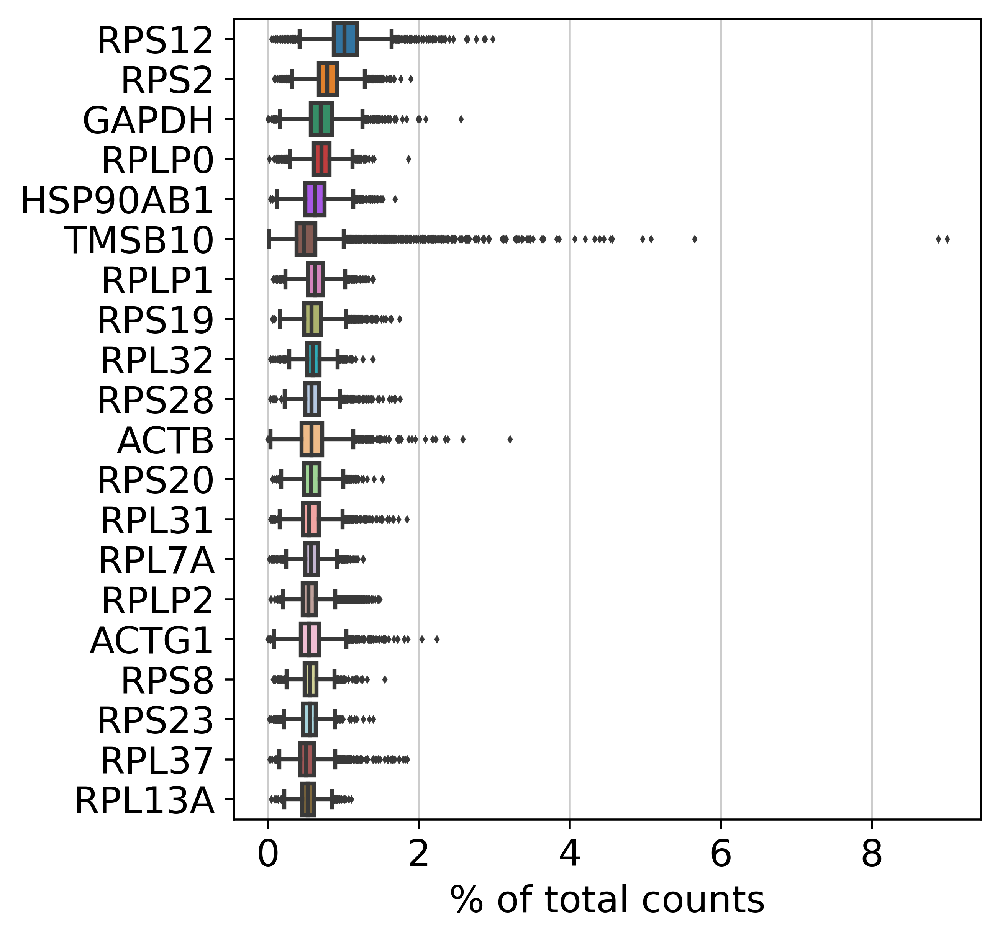

In [5]:
sc.pl.highest_expr_genes(adatac, n_top=20)

In [6]:
sc.pp.filter_cells(adatac, min_genes=2000)
sc.pp.filter_genes(adatac, min_cells=3)

filtered out 87 cells that have less than 2000 genes expressed
filtered out 7125 genes that are detected in less than 3 cells


In [7]:
# Bovine mitochondrial genes
#https://genome.ucsc.edu/cgi-bin/hgTables?hgsid=1471262743_7XSVpRXzjvpAACt3yaXhAlmZaVMV
mito = pd.read_csv('Data/mito.txt', sep='\t')
mito.head()

,#bin,name,chrom,strand,txStart,txEnd,cdsStart,cdsEnd,exonCount,exonStarts,exonEnds,score,name2,cdsStartStat,cdsEndStat,exonFrames
0,585,YP_209205.1,chrM,+,3100,4056,3100,4056,1,"3100,","4056,",0,ND1,cmpl,cmpl,"0,"
1,585,YP_209206.1,chrM,+,4265,5307,4265,5307,1,"4265,","5307,",0,ND2,cmpl,cmpl,"0,"
2,585,YP_209207.1,chrM,+,5686,7231,5686,7231,1,"5686,","7231,",0,COX1,cmpl,cmpl,"0,"
3,585,YP_209208.1,chrM,+,7373,8057,7373,8057,1,"7373,","8057,",0,COX2,cmpl,cmpl,"0,"
4,585,YP_209209.1,chrM,+,8128,8329,8128,8329,1,"8128,","8329,",0,ATP8,cmpl,cmpl,"0,"


In [8]:
adatac.var['mt'] = [True if i in mito.name2.values else False for i in adatac.var_names] # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adatac, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

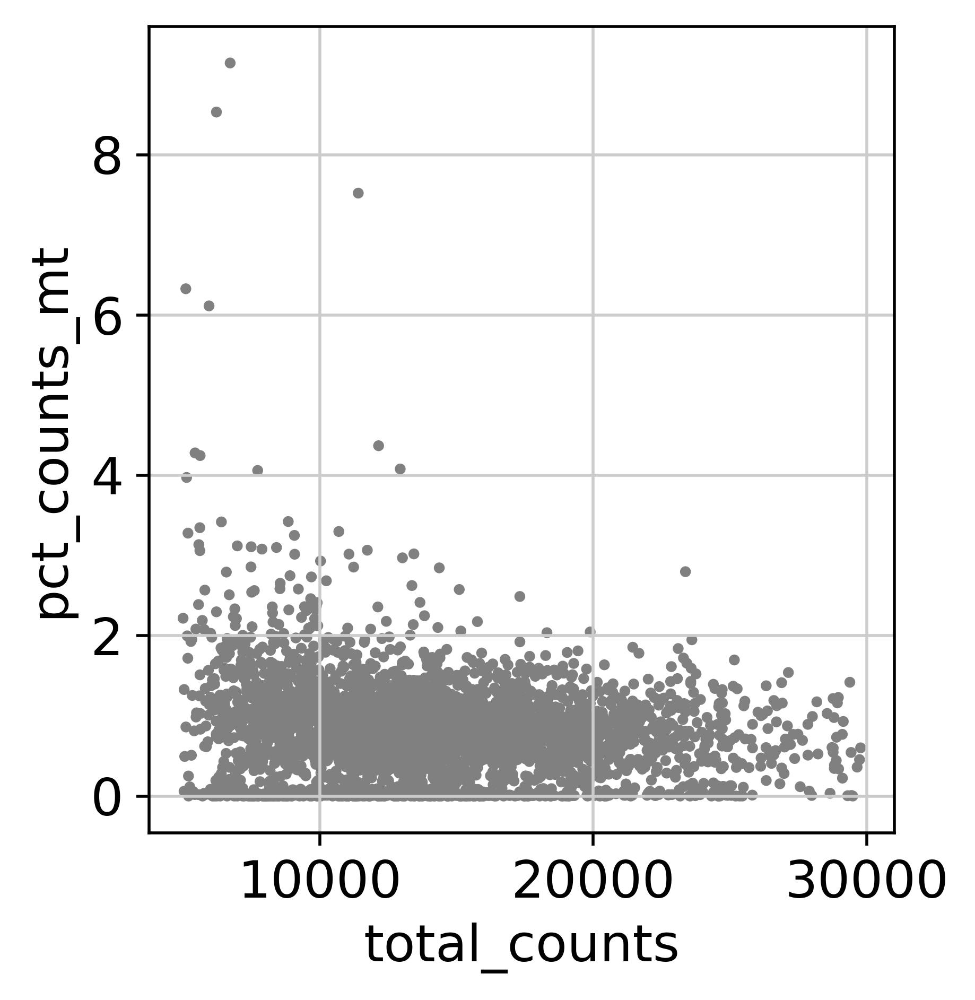

In [9]:
sc.pl.scatter(adatac, x='total_counts', y='pct_counts_mt')


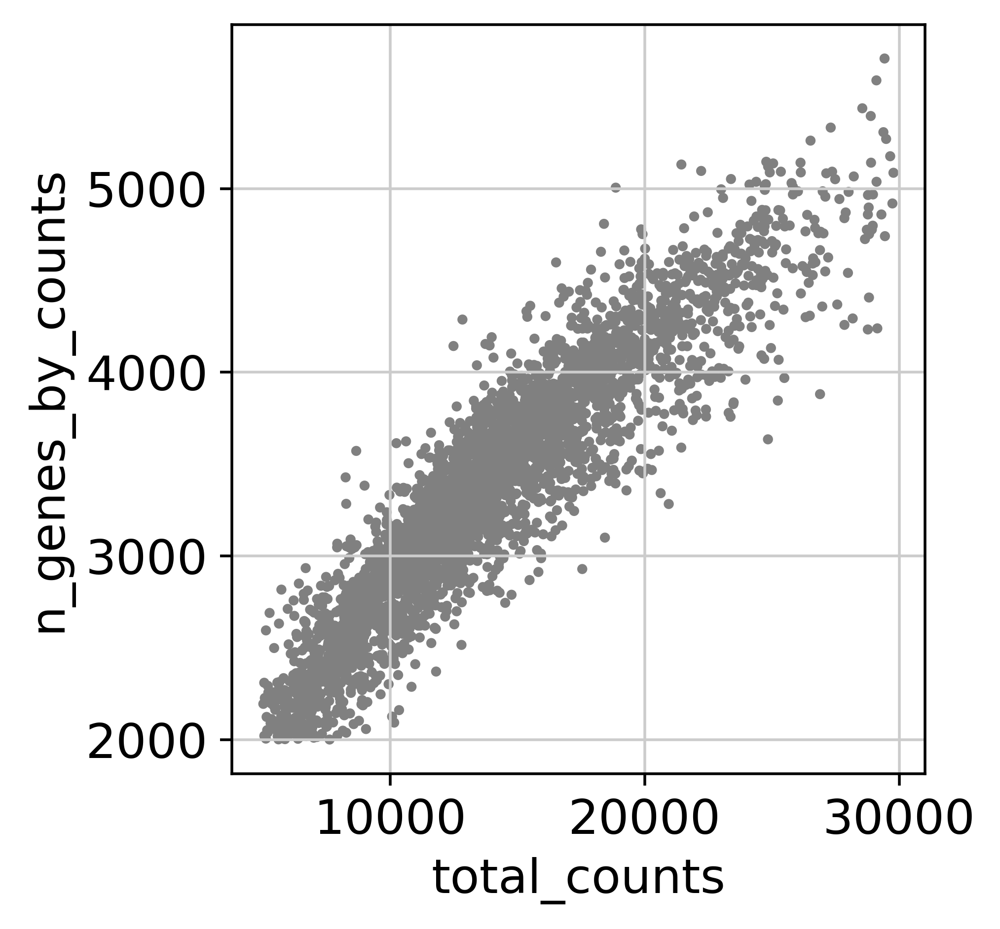

In [10]:
sc.pl.scatter(adatac, x='total_counts', y='n_genes_by_counts')


In [11]:
adatac = adatac[(adatac.obs.pct_counts_mt<4), :].copy()

In [12]:
adatac.raw = adatac.copy()

In [13]:
sc.pp.normalize_total(adatac, target_sum=1e6)
sc.pp.log1p(adatac)

normalizing counts per cell
    finished (0:00:00)


extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


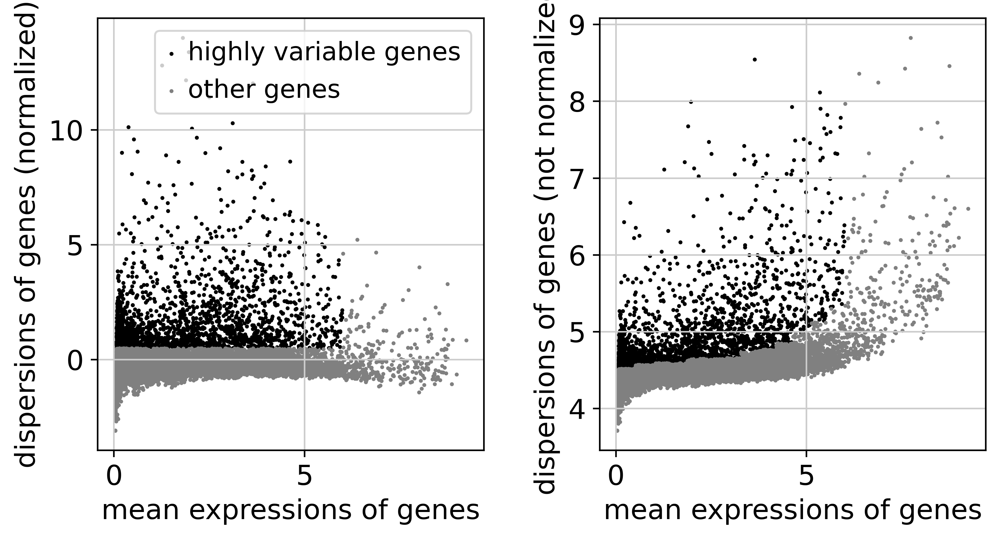

In [14]:
sc.pp.highly_variable_genes(adatac, max_mean=6)
sc.pl.highly_variable_genes(adatac)

In [15]:
adatac = adatac[:, adatac.var.highly_variable].copy()
adatac

AnnData object with n_obs × n_vars = 3448 × 2136
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'tech', 'celltype', 'data', 'percent.mt', 'sample', 'source', 'ident', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'logcounts'

In [16]:
sc.pp.scale(adatac, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


## Plotting

In [17]:
sc.tl.pca(adatac, svd_solver='arpack', use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


In [18]:
sc.pp.neighbors(adatac)
sc.tl.umap(adatac)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


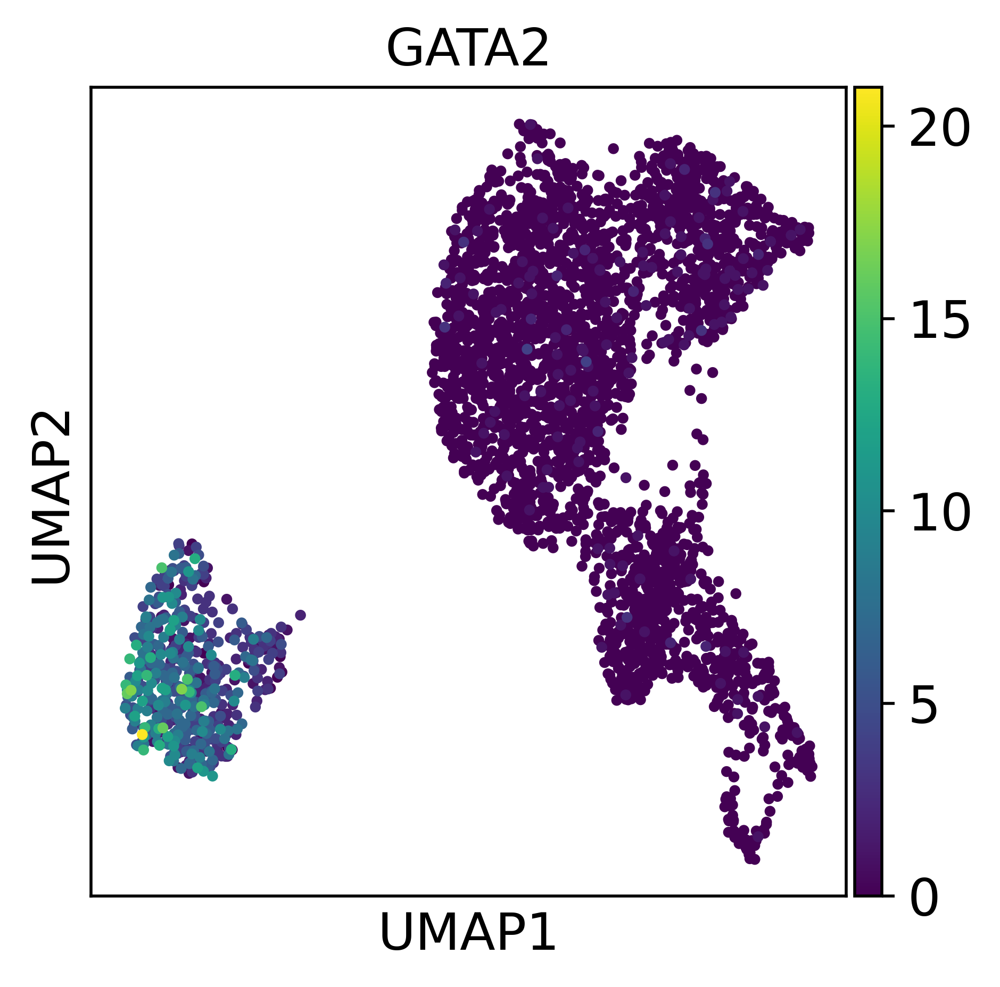

In [19]:
sc.pl.umap(adatac, color="GATA2", show=False)
plt.savefig('Figures/S2F.pdf', bbox_inches="tight")

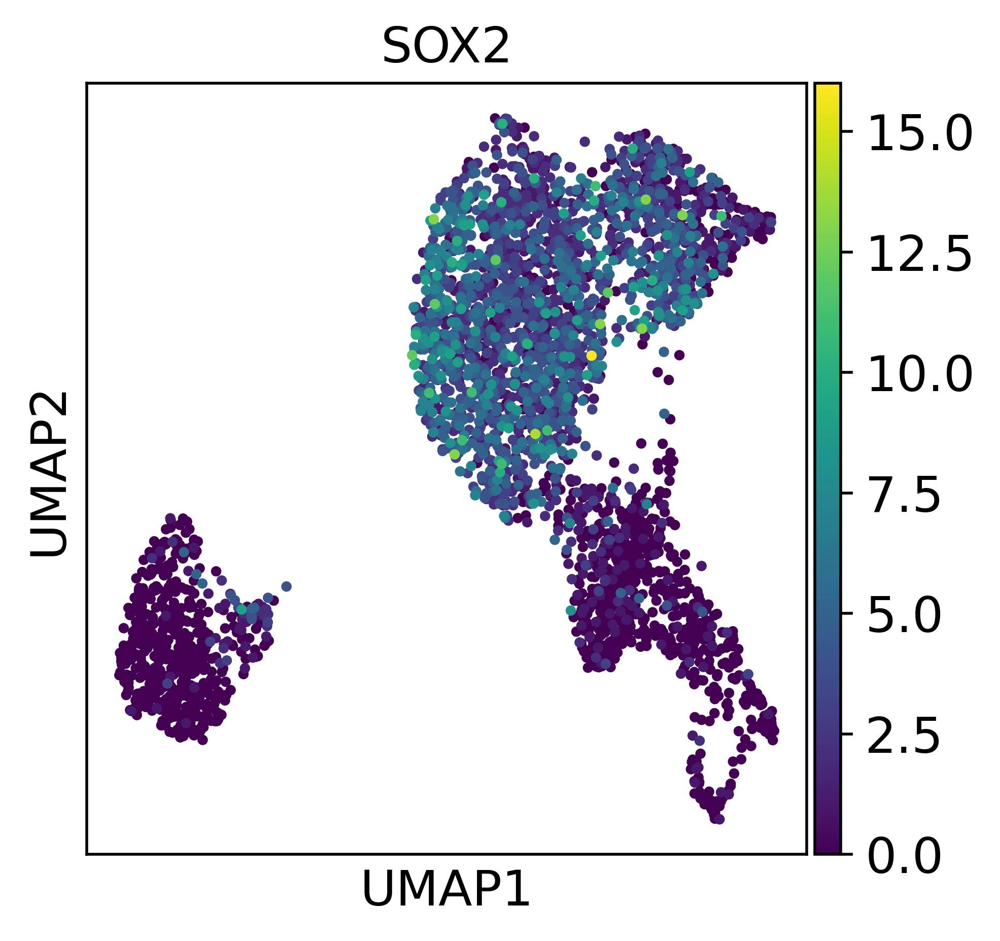

In [20]:
sc.pl.umap(adatac, color="SOX2", show=False)
plt.savefig('Figures/S2G.pdf', bbox_inches="tight")

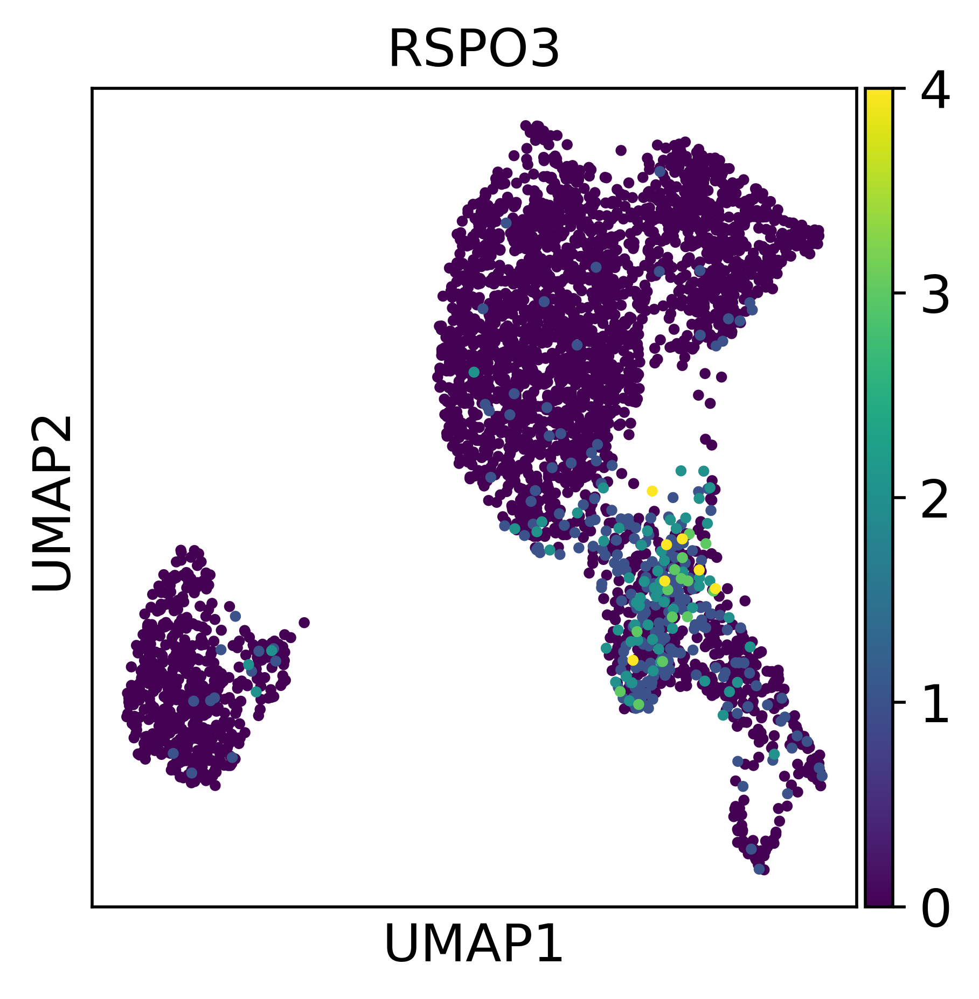

In [21]:
sc.pl.umap(adatac, color="RSPO3", show=False)
plt.savefig('Figures/S2H.pdf', bbox_inches="tight")

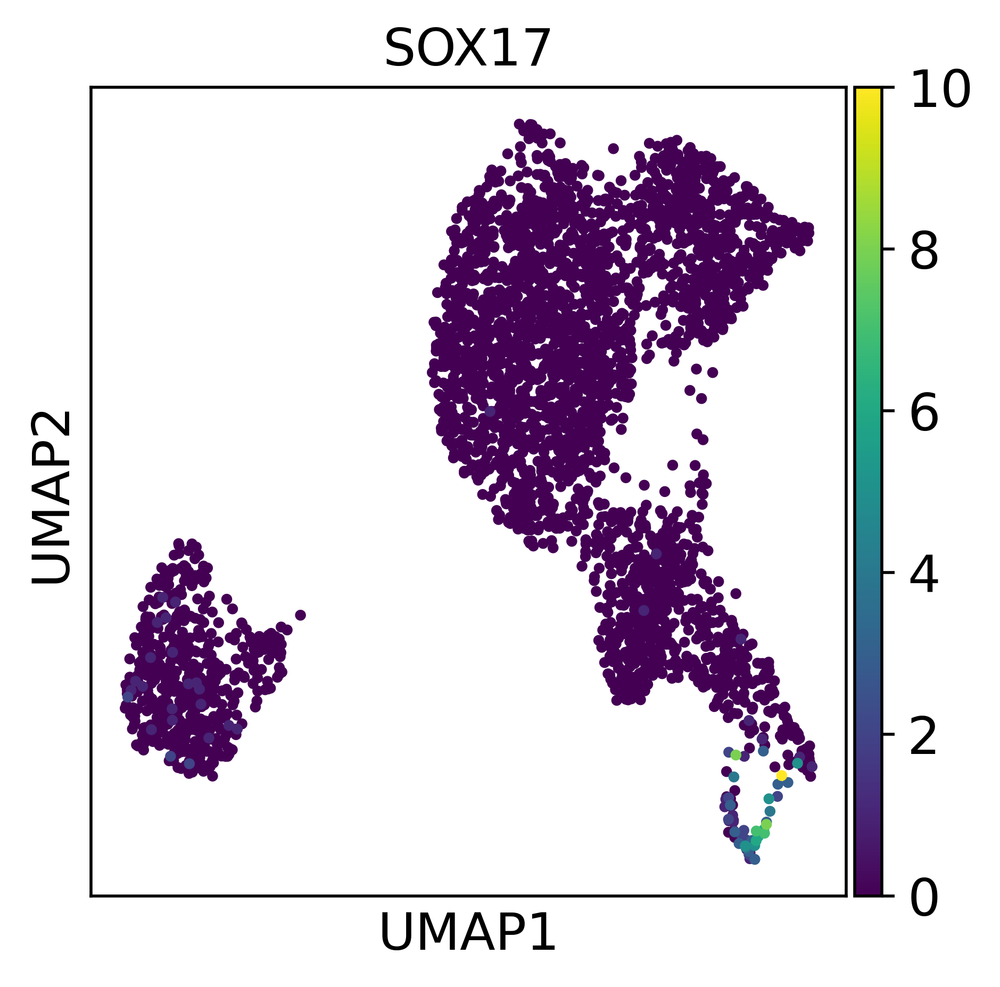

In [22]:
sc.pl.umap(adatac, color="SOX17", show=False)
plt.savefig('Figures/S2I.pdf', bbox_inches="tight")

In [23]:
sc.tl.leiden(adatac, resolution=0.5)

running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


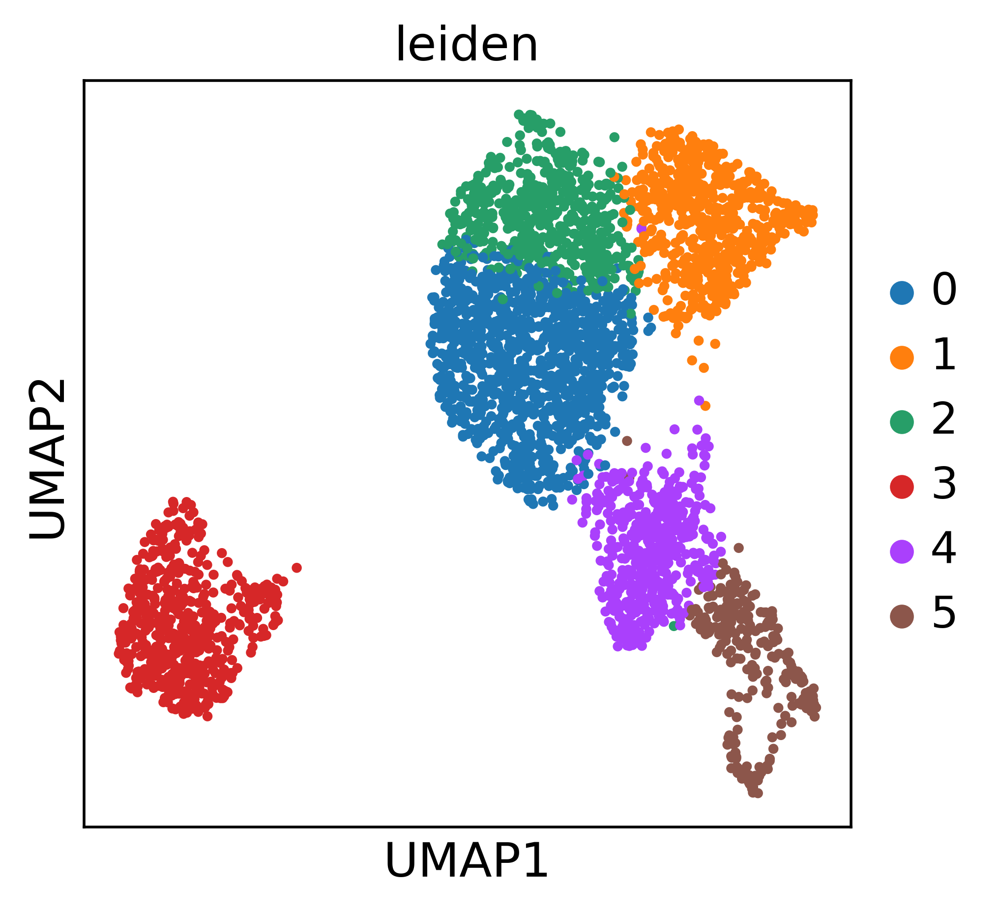

In [24]:
sc.pl.umap(adatac, color="leiden", show=False)
plt.savefig('Figures/S2E_clusters_low_res.pdf', bbox_inches="tight")

In [25]:
lines_dict = {'0':'EPI', '1':'EPI', 
              '2':'EPI', '3':'TE',
              '4':'EPI_TO_HYPO', '5':'HYPO'}

/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


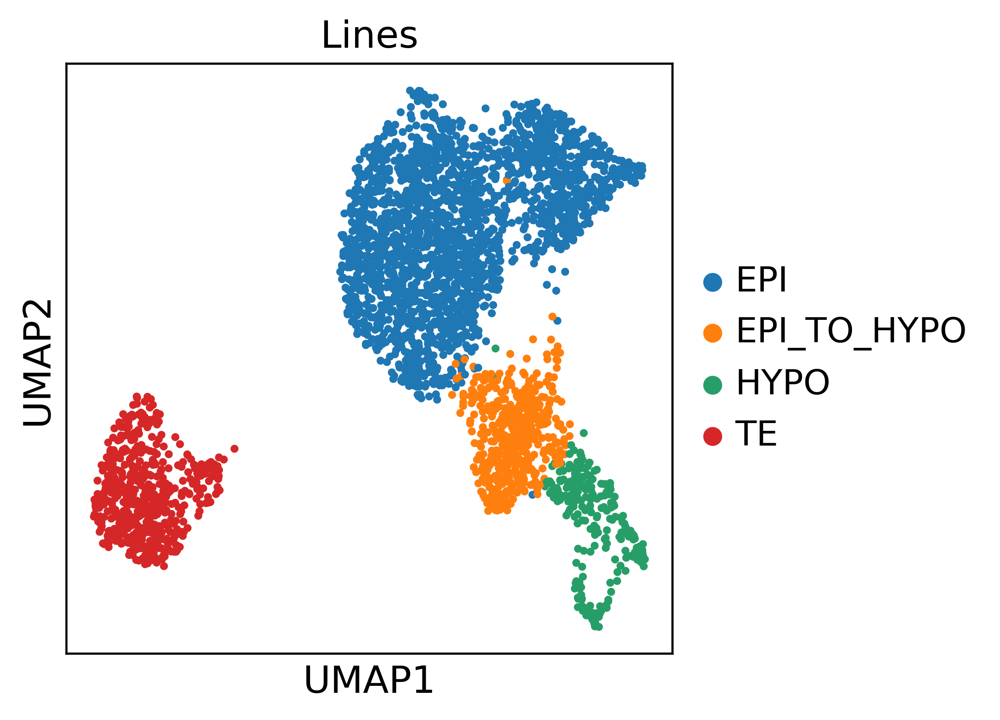

In [26]:
adatac.obs['Lines'] = [lines_dict[i] for i in adatac.obs.leiden]
sc.pl.umap(adatac, color='Lines', show=False)
plt.savefig('Figures/S2E_lines.pdf', bbox_inches="tight")

## Clustering for Pseudobulk


In [27]:
sc.tl.leiden(adatac, resolution=5.5)

running Leiden clustering
    finished: found 52 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


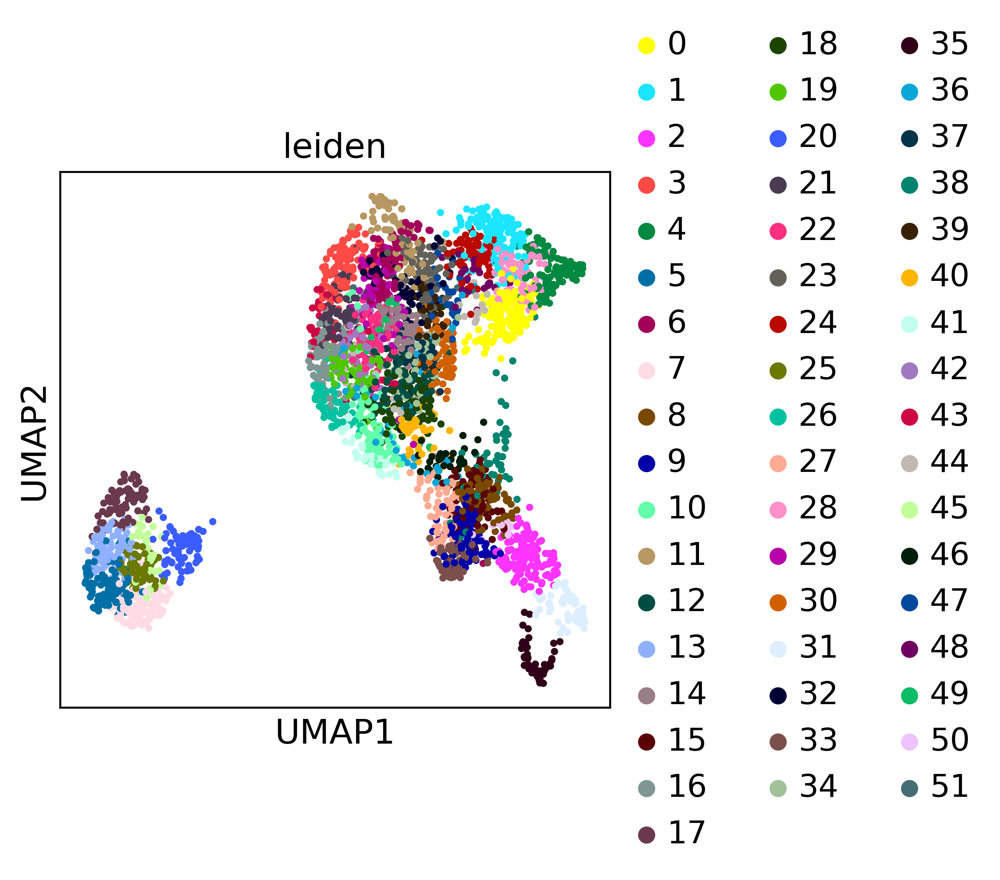

In [28]:
sc.pl.umap(adatac, color="leiden", show=False)
plt.savefig('Figures/S2E_clusters_high_res.pdf', bbox_inches="tight")

In [29]:
dall = adatac.raw.to_adata()

In [30]:
d = pd.DataFrame(dall.X.todense())
d.columns = dall.var_names
d.index = dall.obs.index
d['leiden'] = dall.obs.leiden

In [31]:
pseudo = d.groupby('leiden').sum()

In [32]:
pseudo.index = [i + "_ Blastoid" for i in pseudo.index]
pseudo

,ENSBTAG00000001753,CBX3,RCAN1,KCNE1,SMIM11A,MRPS6,ATP5PO,ITSN1,CRYZL1,DONSON,...,MT-CYB,TMEM18,ACP1,TMSB4X.1,SH3YL1,SLC25A6,PLCXD1,ENSBTAG00000046338,RNH1,DPP7
0_ Blastoid,21.0,1.0,2.0,0.0,218.0,413.0,1235.0,149.0,84.0,82.0,...,1110.0,30.0,267.0,1.0,6.0,5241.0,5.0,8.0,582.0,17.0
1_ Blastoid,6.0,0.0,0.0,0.0,128.0,163.0,869.0,82.0,44.0,43.0,...,134.0,11.0,176.0,2.0,1.0,3125.0,0.0,5.0,258.0,11.0
2_ Blastoid,7.0,0.0,10.0,8.0,180.0,328.0,822.0,123.0,50.0,74.0,...,5093.0,21.0,206.0,0.0,8.0,2094.0,0.0,5.0,383.0,6.0
3_ Blastoid,41.0,0.0,5.0,0.0,170.0,303.0,1133.0,168.0,53.0,69.0,...,5248.0,14.0,214.0,0.0,4.0,2988.0,2.0,8.0,147.0,7.0
4_ Blastoid,5.0,1.0,1.0,0.0,141.0,252.0,742.0,56.0,24.0,38.0,...,404.0,26.0,269.0,2.0,2.0,2061.0,3.0,2.0,353.0,13.0
5_ Blastoid,2.0,0.0,7.0,0.0,56.0,274.0,862.0,49.0,32.0,34.0,...,2067.0,37.0,230.0,0.0,29.0,4968.0,37.0,9.0,1549.0,1.0
6_ Blastoid,6.0,0.0,3.0,0.0,78.0,185.0,486.0,92.0,14.0,37.0,...,2526.0,8.0,92.0,0.0,4.0,1479.0,0.0,2.0,75.0,4.0
7_ Blastoid,0.0,0.0,7.0,0.0,30.0,132.0,438.0,26.0,11.0,9.0,...,1458.0,21.0,116.0,0.0,20.0,2993.0,27.0,11.0,907.0,0.0
8_ Blastoid,2.0,1.0,2.0,0.0,107.0,310.0,683.0,91.0,30.0,65.0,...,4267.0,17.0,166.0,0.0,5.0,1478.0,0.0,5.0,231.0,2.0
9_ Blastoid,0.0,0.0,2.0,0.0,85.0,214.0,554.0,66.0,21.0,51.0,...,3344.0,9.0,114.0,0.0,1.0,1320.0,1.0,6.0,138.0,0.0


# Pseudobulk and Blastocyst Integration

## Data Integraton

In [33]:
embryos = adata[adata.obs.data!="data0_Carlos"].copy()
embryos

AnnData object with n_obs × n_vars = 426 × 22168
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'tech', 'celltype', 'data', 'percent.mt', 'sample', 'source', 'ident'
    layers: 'logcounts'

In [34]:
studies = {"data1_29511234": "Lavagi et al. (2018) - Smart-seq2", "data2_Jiang": "Jiang et al. (unpublished) - Smart-seq2", "data3_35971640": "Zhao et al. (2022) - STRT-seq"}
embryos.obs["Study"] = [studies[i] for i in embryos.obs.data.values]

In [35]:
meta = pd.DataFrame({"celltype": ["Blastoid" for i in range(pseudo.shape[0])],
                     "data": ["data0_Carlos" for i in range(pseudo.shape[0])],
                     "Study": ["Blastoid - 10x Pseudo-Bulk" for i in range(pseudo.shape[0])]}, index=pseudo.index)
meta.head()

,celltype,data,Study
0_ Blastoid,Blastoid,data0_Carlos,Blastoid - 10x Pseudo-Bulk
1_ Blastoid,Blastoid,data0_Carlos,Blastoid - 10x Pseudo-Bulk
2_ Blastoid,Blastoid,data0_Carlos,Blastoid - 10x Pseudo-Bulk
3_ Blastoid,Blastoid,data0_Carlos,Blastoid - 10x Pseudo-Bulk
4_ Blastoid,Blastoid,data0_Carlos,Blastoid - 10x Pseudo-Bulk


In [36]:
adatapseudo = ad.AnnData(X=pseudo, obs=meta)

In [37]:
adata = sc.concat([adatapseudo, embryos])
adata

AnnData object with n_obs × n_vars = 478 × 15043
    obs: 'celltype', 'data', 'Study'

## QC and Preparation

normalizing counts per cell
    finished (0:00:00)


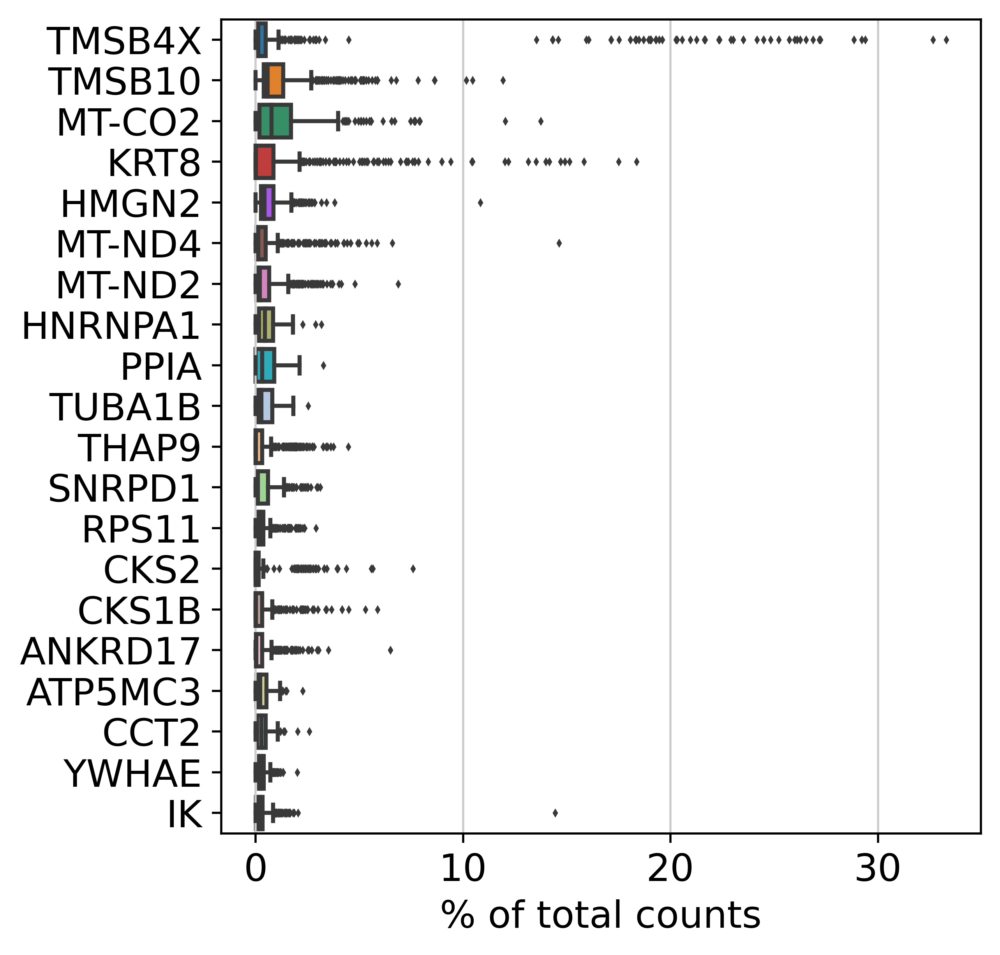

In [38]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [39]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 3 cells that have less than 200 genes expressed
filtered out 12 genes that are detected in less than 3 cells


In [40]:
adata.var['mt'] = [True if i in mito.name2.values else False for i in adata.var_names]
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

<Axes: xlabel='data', ylabel='pct_counts_mt'>

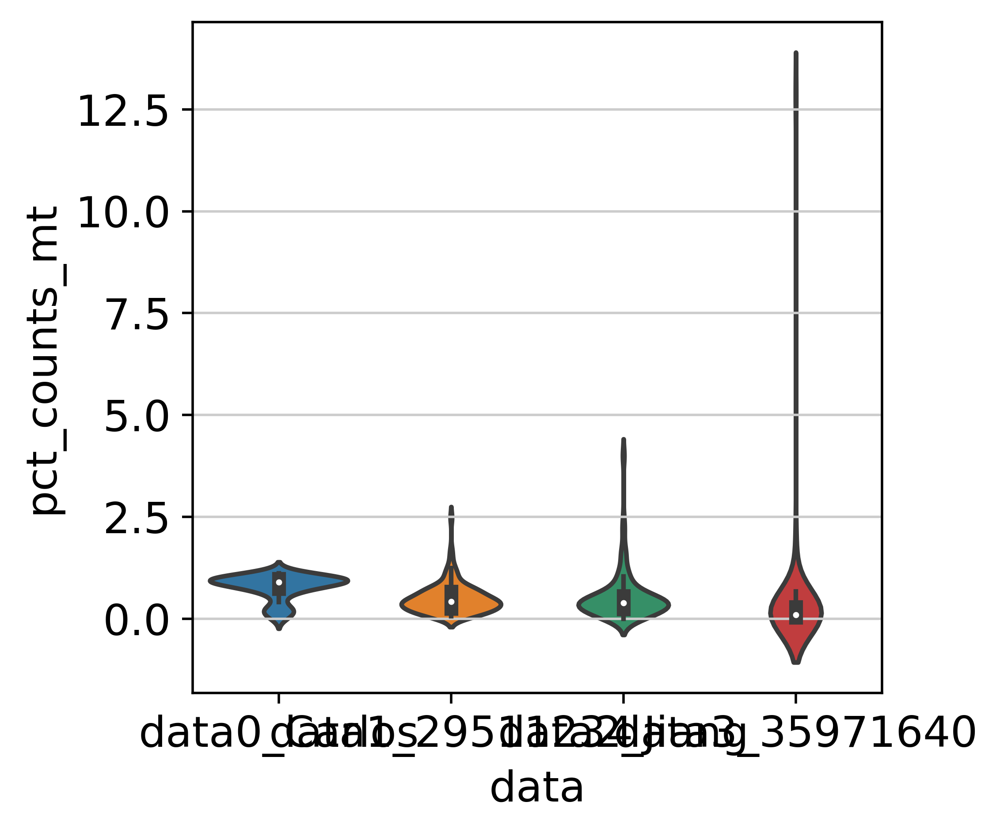

In [41]:
sns.violinplot(y = adata.obs["pct_counts_mt"], x=adata.obs["data"])

<Axes: xlabel='data', ylabel='n_genes_by_counts'>

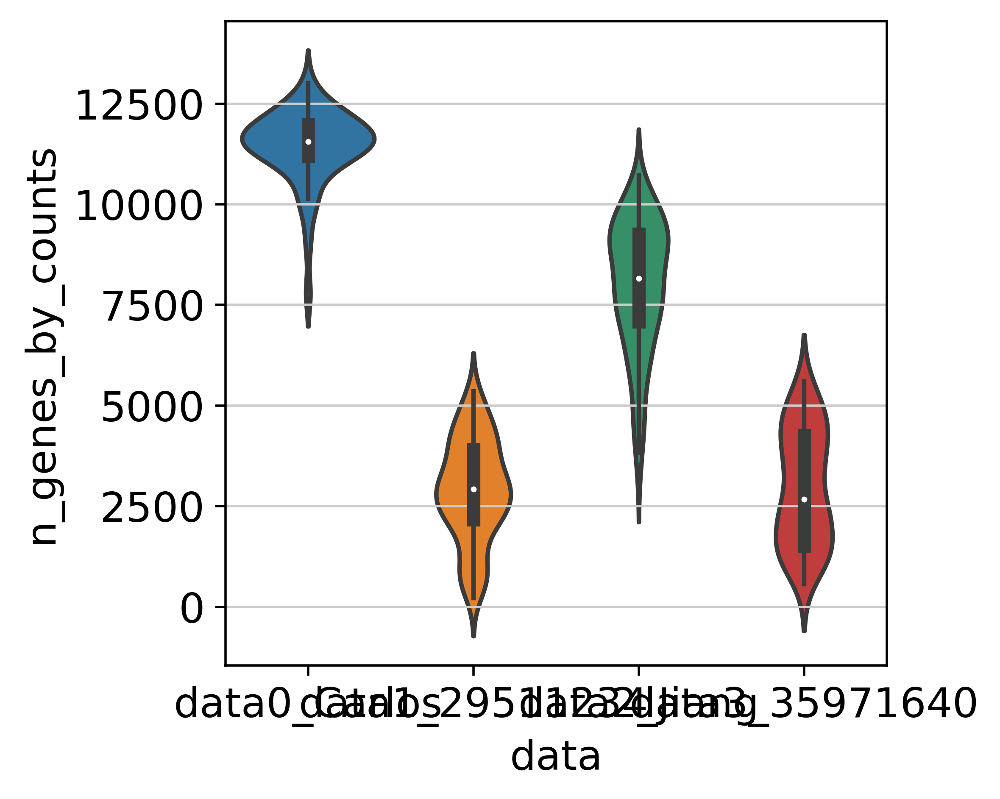

In [42]:
sns.violinplot(y = adata.obs.n_genes_by_counts, x=adata.obs["data"])

<Axes: xlabel='data', ylabel='total_counts'>

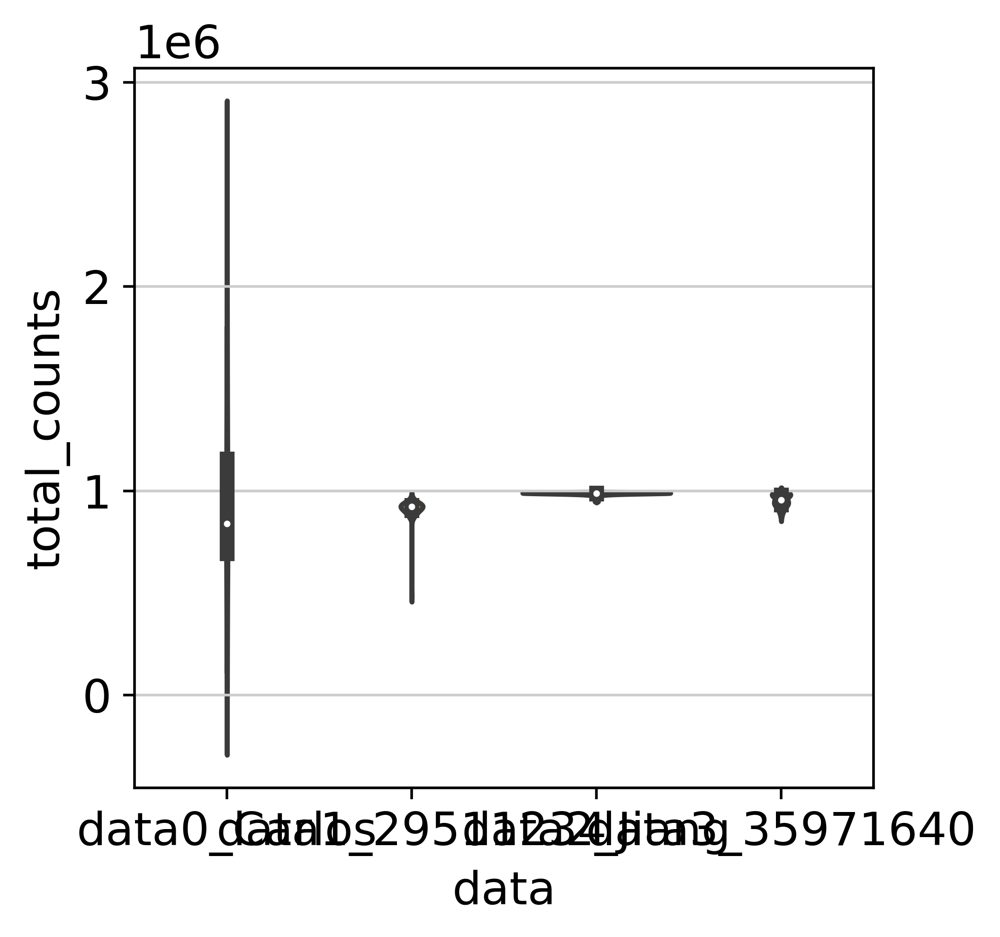

In [43]:
sns.violinplot(y = adata.obs.total_counts, x = adata.obs.data)

In [44]:
adata = adata[(adata.obs.pct_counts_mt<4), :].copy()

In [45]:
sc.pp.normalize_total(adata, target_sum=1e6)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


In [46]:
adata.raw = adata.copy()

In [47]:
adata.obs['method'] = ['10x' if i=='data0_Carlos' else 'SS2' for i in adata.obs.data]

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


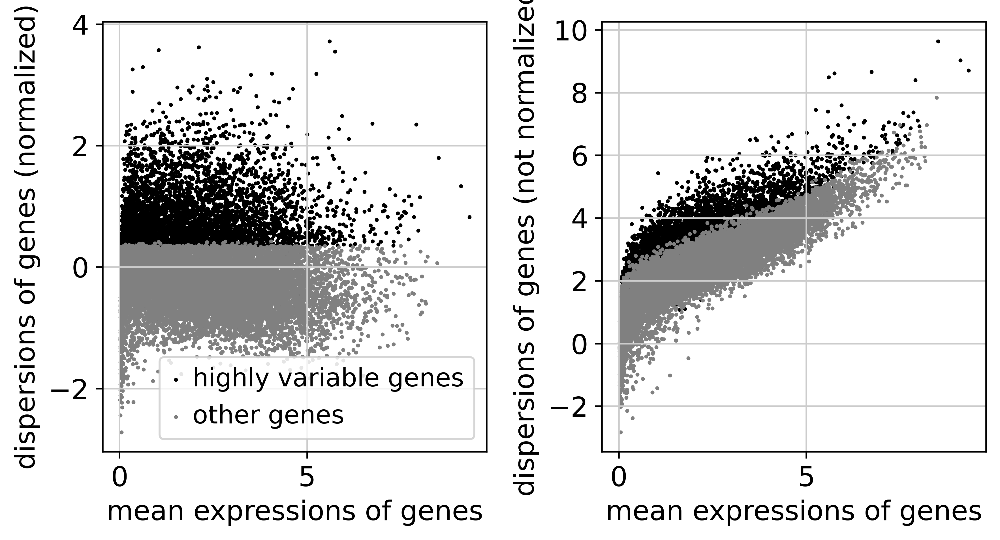

In [48]:
sc.pp.highly_variable_genes(adata, batch_key='method', n_top_genes=4000)
sc.pl.highly_variable_genes(adata)

In [49]:
adata = adata[:, adata.var.highly_variable].copy()

In [50]:
sc.pp.scale(adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


## Plotting

### PCA

In [51]:
sc.tl.pca(adata, svd_solver='arpack', use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


In [52]:
linesdic = {'Blastoid':"Blastoid", 'IVF_8 cell':'8 cell', 'IVF_16 cell':'16 cell', 'IVF_vitro':'Early Blastocyst',
            'IVF_vivo':'Early Blastocyst', 'IVF_blastocyst':'Early Blastocyst', 'IVF_zygote':'Zygote', 'IVF_morula':'Morula', 'IVF_2 cell':'2 cell'}
adata.obs["Developmental Stage"] = [linesdic[i] for i in adata.obs.celltype.values]

2023-04-02 14:00:11,998 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2023-04-02 14:00:12,481 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2023-04-02 14:00:12,493 - harmonypy - INFO - Iteration 1 of 100
INFO:harmonypy:Iteration 1 of 100
2023-04-02 14:00:12,601 - harmonypy - INFO - Iteration 2 of 100
INFO:harmonypy:Iteration 2 of 100
2023-04-02 14:00:12,689 - harmonypy - INFO - Iteration 3 of 100
INFO:harmonypy:Iteration 3 of 100
2023-04-02 14:00:12,774 - harmonypy - INFO - Iteration 4 of 100
INFO:harmonypy:Iteration 4 of 100
2023-04-02 14:00:12,861 - harmonypy - INFO - Iteration 5 of 100
INFO:harmonypy:Iteration 5 of 100
2023-04-02 14:00:12,959 - harmonypy - INFO - Iteration 6 of 100
INFO:harmonypy:Iteration 6 of 100
2023-04-02 14:00:13,018 - harmonypy - INFO - Iteration 7 of 100
INFO:harmonypy:Iteration 7 of 100
2023-04-02 1

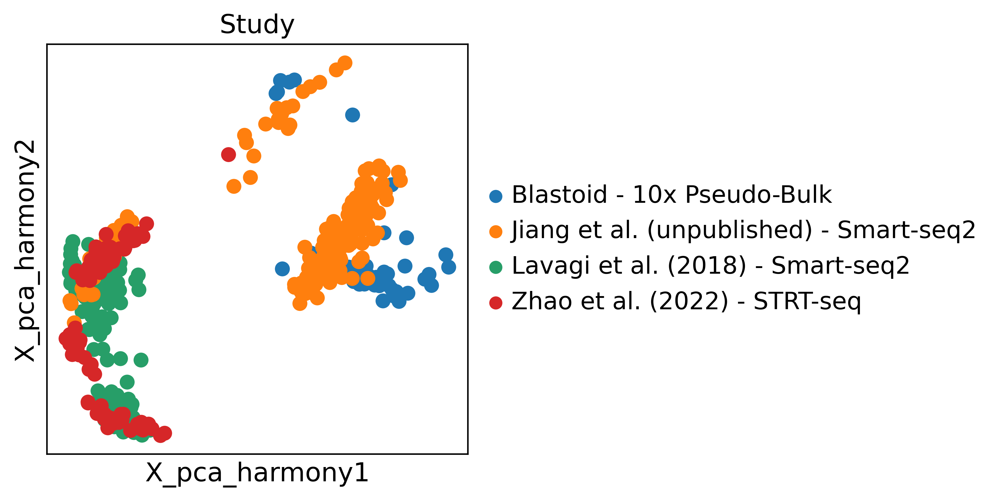

In [53]:
sc.external.pp.harmony_integrate(adata, key='data', max_iter_harmony=100, sigma=0.2)
sc.pl.embedding(adata, basis='X_pca_harmony',  color='Study', show=False)
plt.savefig('Figures/S2J_Dataset.pdf', bbox_inches="tight")

/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


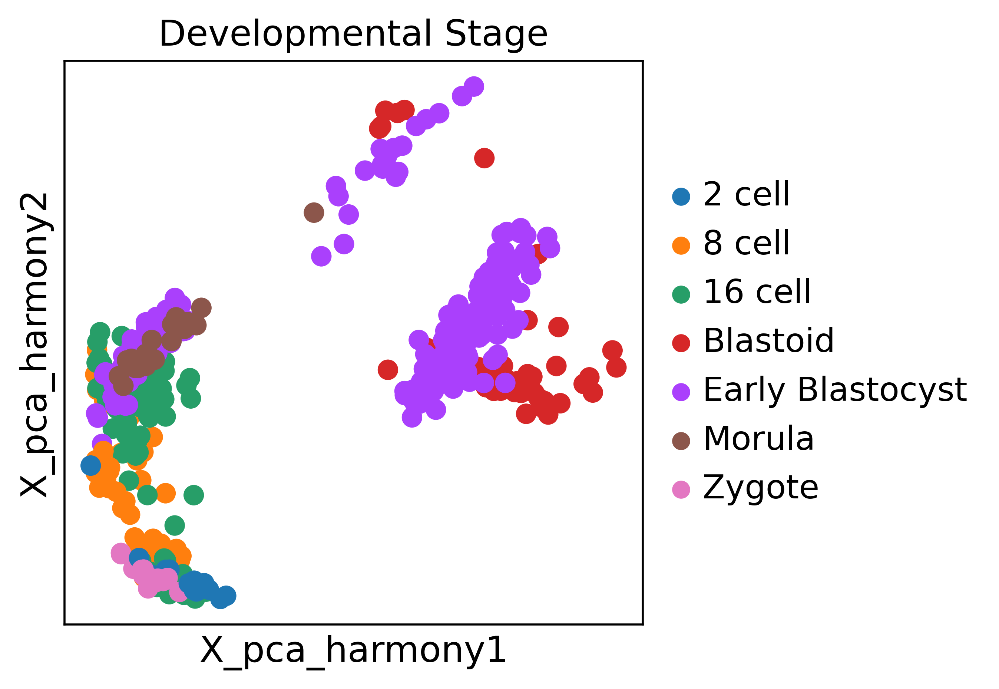

In [54]:
sc.pl.embedding(adata, basis='X_pca_harmony',  color='Developmental Stage', show=False)
plt.savefig('Figures/S2J_DevStage.pdf', bbox_inches="tight")

/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


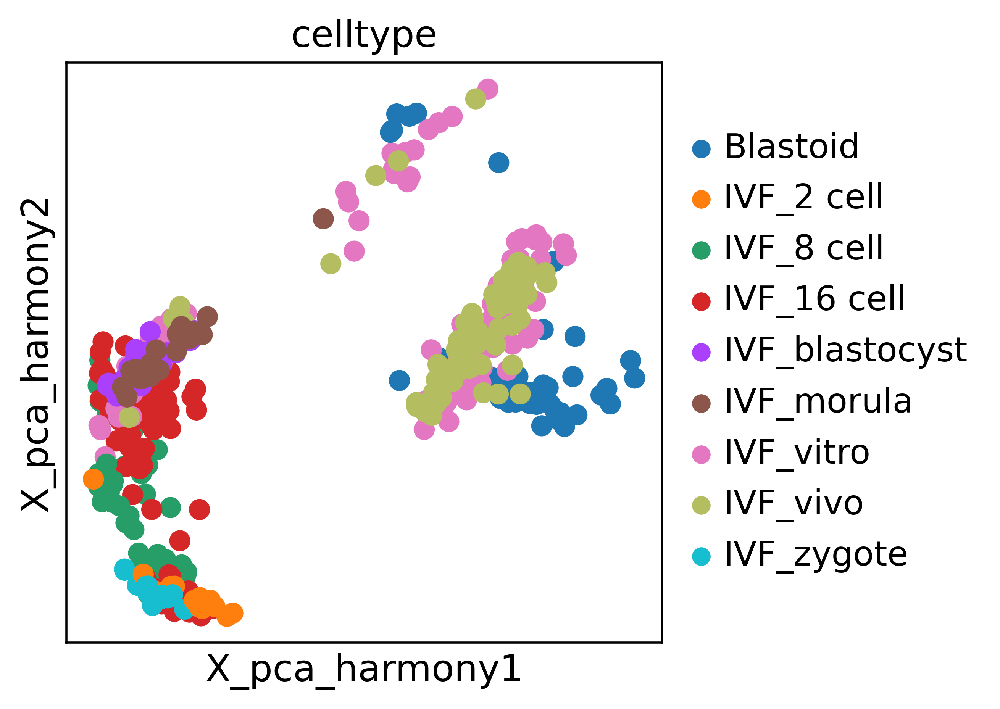

In [55]:
sc.pl.embedding(adata, basis='X_pca_harmony',  color='celltype', show=False)
plt.savefig('Figures/S2J_CellType.pdf', bbox_inches="tight")

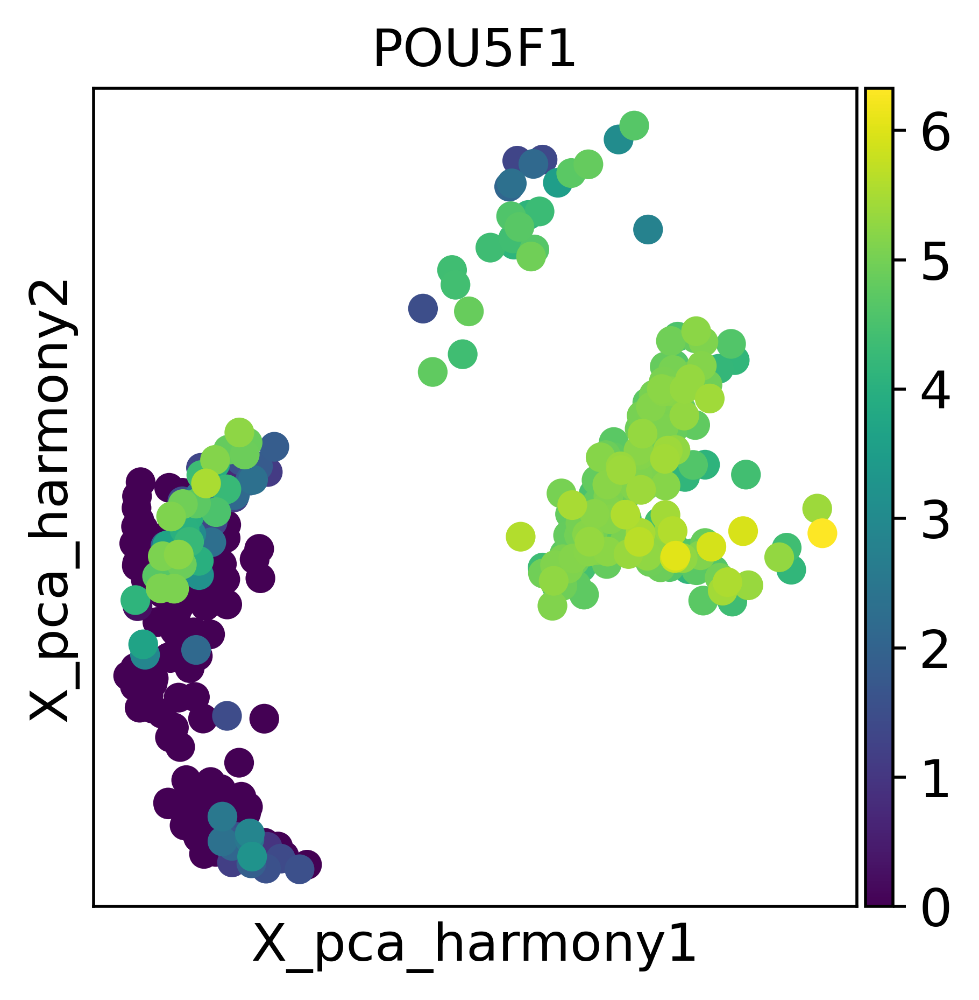

In [56]:
sc.pl.embedding(adata, basis='X_pca_harmony',  color='POU5F1', show=False)
plt.savefig('Figures/S2L_POU5F1.pdf', bbox_inches="tight")

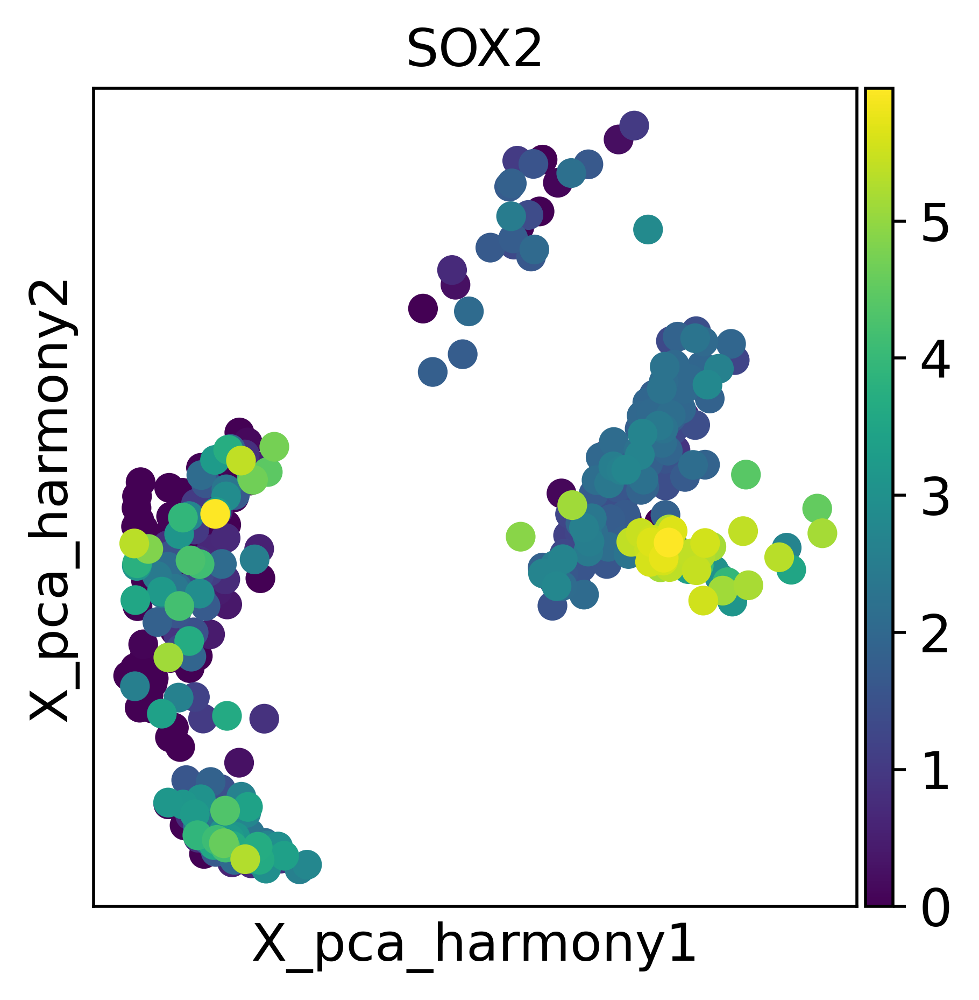

In [57]:
sc.pl.embedding(adata, basis='X_pca_harmony',  color='SOX2', show=False)
plt.savefig('Figures/S2L_SOX2.pdf', bbox_inches="tight")

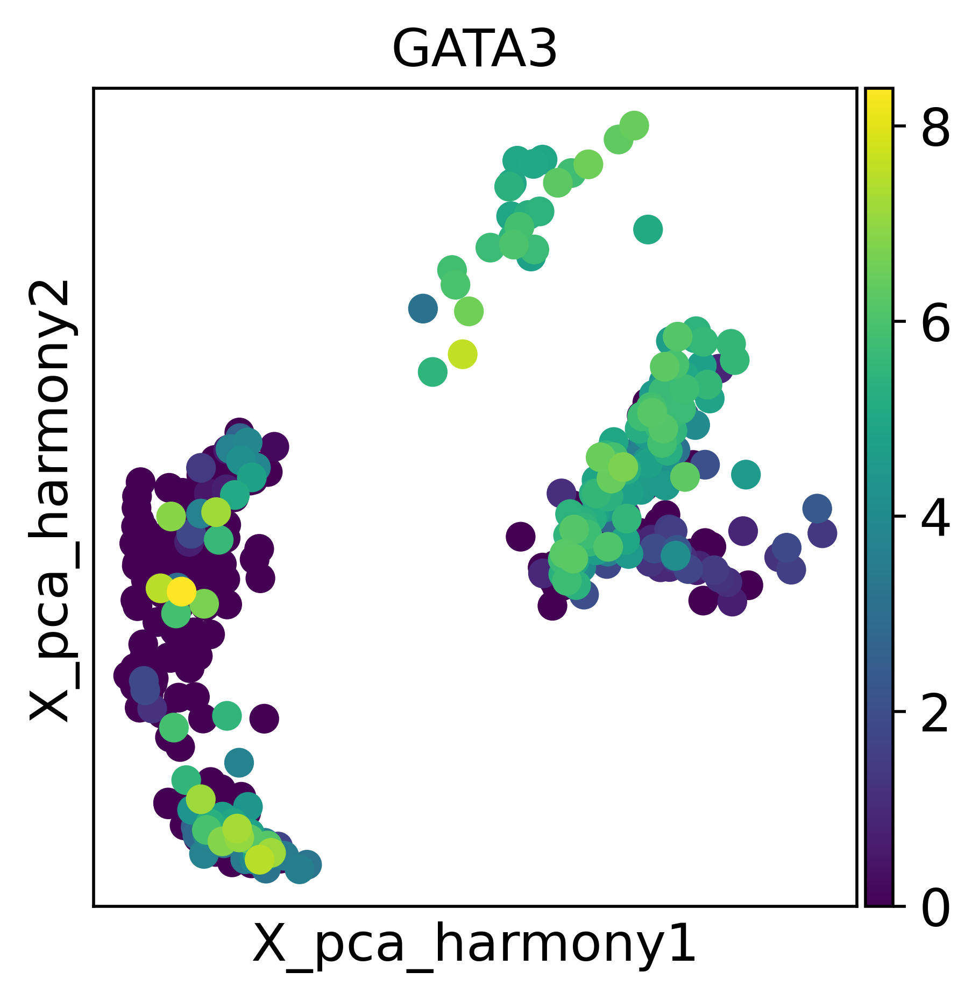

In [58]:
sc.pl.embedding(adata, basis='X_pca_harmony',  color='GATA3', show=False)
plt.savefig('Figures/S2M_GATA3.pdf', bbox_inches="tight")

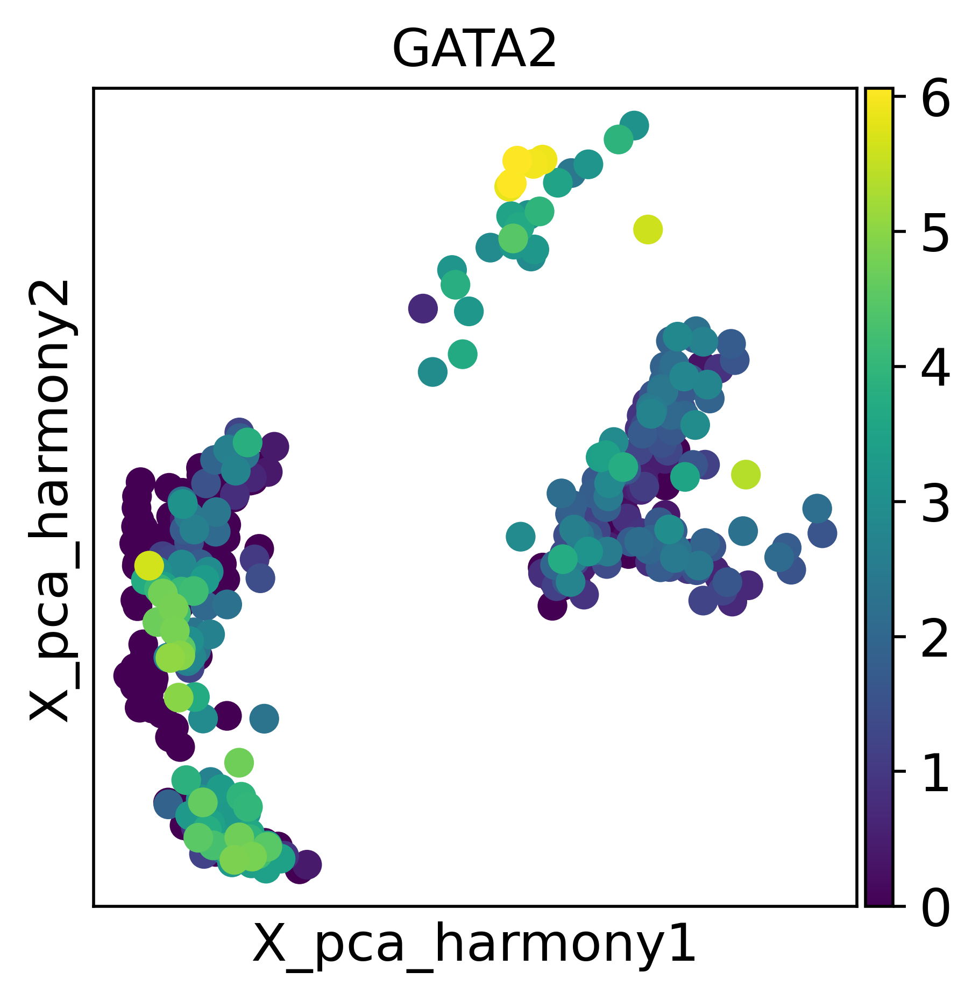

In [59]:
sc.pl.embedding(adata, basis='X_pca_harmony',  color='GATA2', show=False)
plt.savefig('Figures/S2M_GATA2.pdf', bbox_inches="tight")

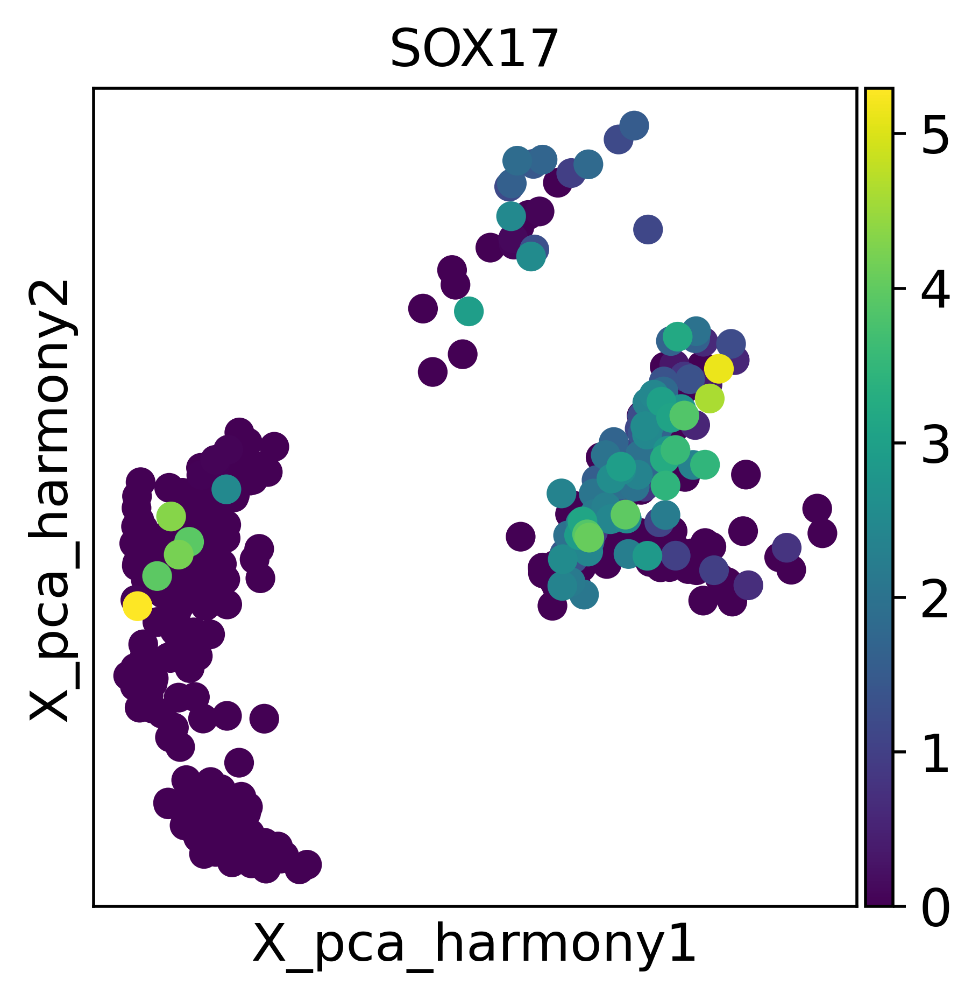

In [60]:
sc.pl.embedding(adata, basis='X_pca_harmony',  color='SOX17', show=False)
plt.savefig('Figures/S2N_SOX17.pdf', bbox_inches="tight")

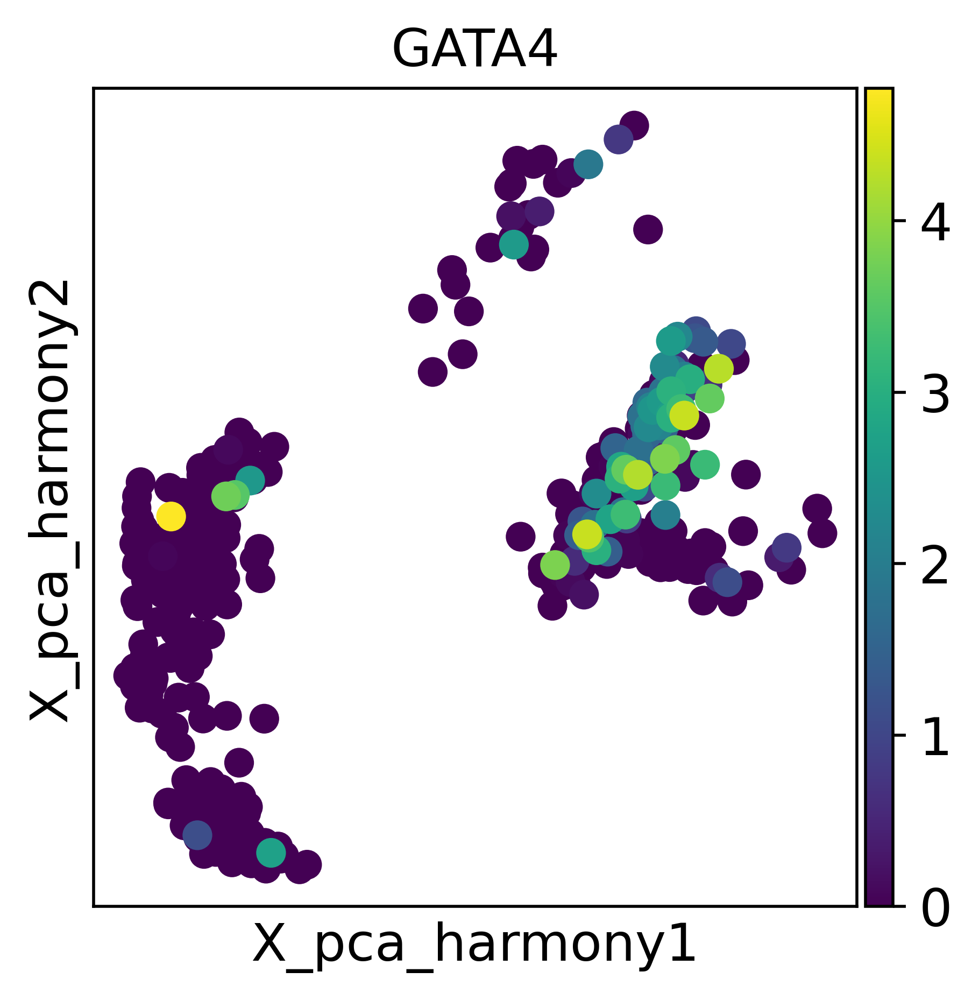

In [61]:
sc.pl.embedding(adata, basis='X_pca_harmony',  color='GATA4', show=False)
plt.savefig('Figures/S2N_GATA4.pdf', bbox_inches="tight")

### Annotation

In [62]:
sc.pp.neighbors(adata, use_rep = 'X_pca_harmony')
sc.tl.leiden(adata, resolution=1.5)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


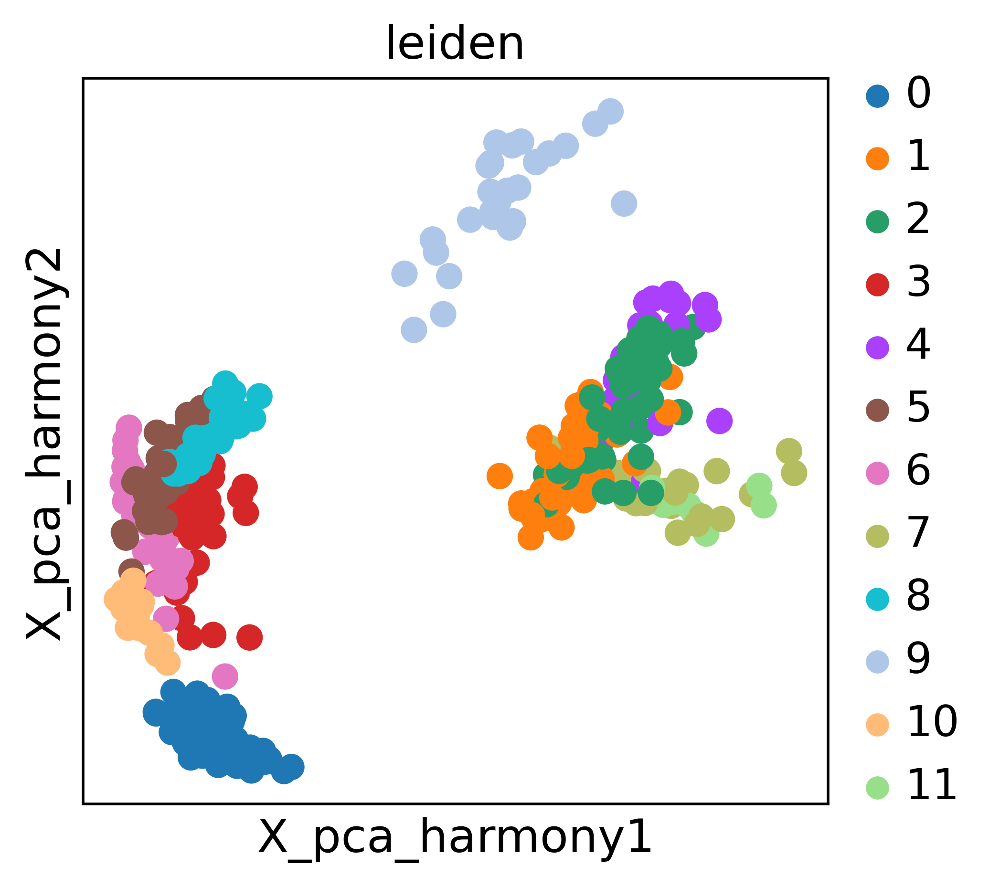

In [63]:
sc.pl.embedding(adata, basis='X_pca_harmony',  color='leiden')

In [64]:
my_markers = {
    "EPI":['POU5F1', 'DUSP5', 'LIN28A', 'NANOG'],
    "Transition":['RSPO3','IGFBP4'],
    "PE":['SOX17', 'GATA4', 'PDGFRA'],
    "TE":['GATA3', 'GATA2', 'DAB2', 'SFN', 'ELF3', 'CGA', 'ASCL2']
    }

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`
categories: 0, 1, 2, etc.
var_group_labels: EPI, Transition, PE, etc.


/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


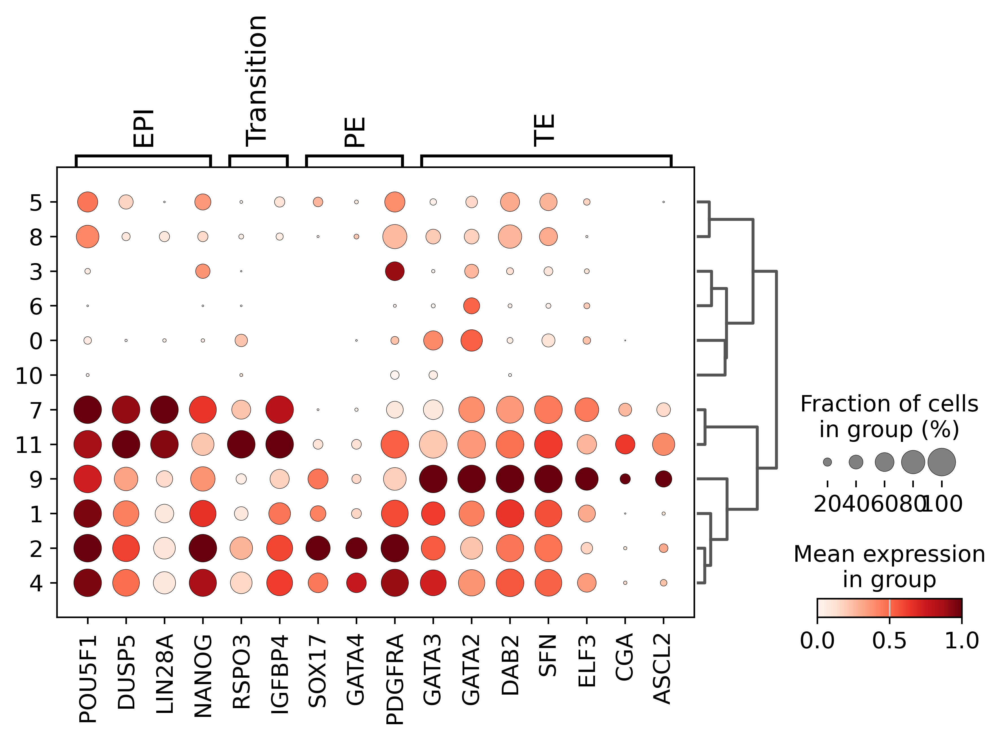

In [65]:
sc.tl.dendrogram(adata, groupby="leiden")
sc.pl.dotplot(adata, my_markers, 'leiden', dendrogram=True, standard_scale='var')

In [66]:
lines_dict = {'0':'Prelineage', '1':'EPI', '2':'HYPO', '3':'Prelineage', '4':'EPI', '5':'Prelineage',
              '6':'Prelineage', '7':'EPI_TO_HYPO', '8':'Prelineage', '9':'TS', '10':'Prelineage', '11':'EPI_TO_HYPO',}

/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


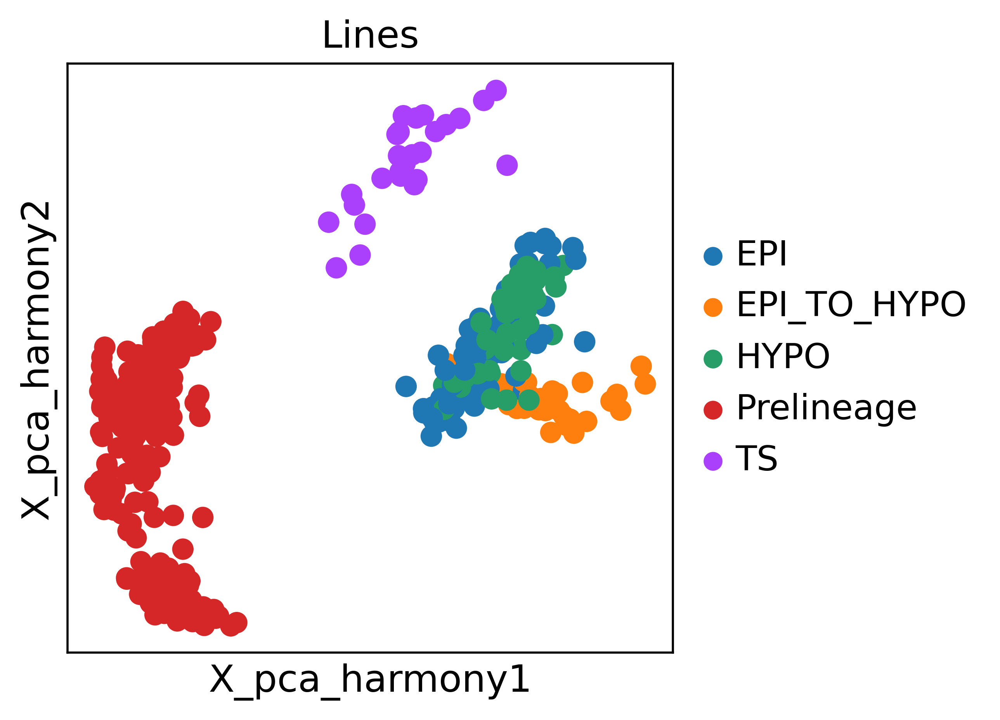

In [67]:
adata.obs['Lines'] = [lines_dict[i] for i in adata.obs.leiden]

sc.pl.embedding(adata, basis='X_pca_harmony',  color='Lines', show=False)
plt.savefig('Figures/S2J_Lines.pdf', bbox_inches="tight")

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Lines']`
categories: EPI, EPI_TO_HYPO, HYPO, etc.
var_group_labels: EPI, Transition, PE, etc.


/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


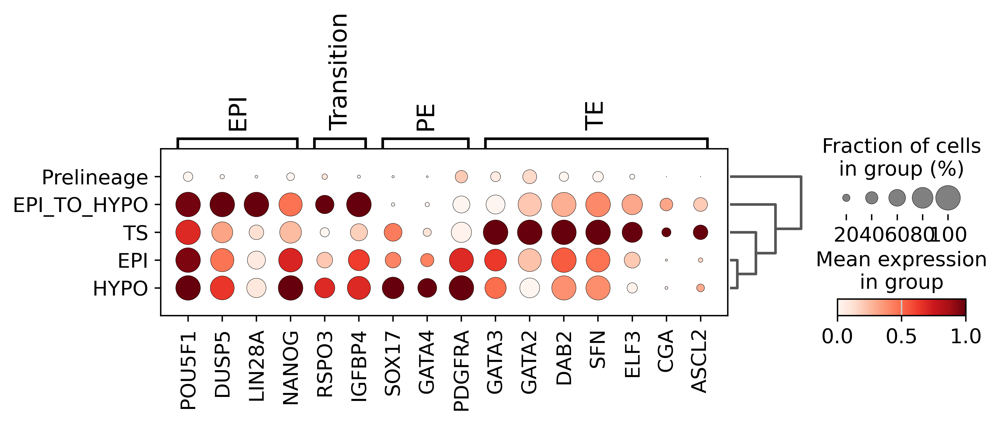

In [68]:
sc.tl.dendrogram(adata, groupby="Lines")
sc.pl.dotplot(adata, my_markers, 'Lines', dendrogram=True, standard_scale='var', show=False)
plt.savefig('Figures/S2K.pdf', bbox_inches="tight")

### Violin plots

In [69]:
Pluripotency = {
    'Pluripotency relared': ['NANOG', 'POU5F1','MYC', 'PRDM1', 'KLF4', 'KLF5', 'TFCP2L1', 'DNMT3A', 'LIN28A', 'SALL4', 'OTX2', 'GATA6', 'GATA3', 'GATA4', 'CD74'],
   }

In [70]:
Signalling = {'FGF': [ 'FGF1', 'FGF2', 'FGFR1', 'FGFR2', 'MAPK1', 'MAPK3', 'MAPK14'],
             'TGFB': ['TGFB1', 'TGFB2','TGFBR1', 'SMAD2', 'SMAD3'],
             'BMP': ['BMP4','BMPR1A','BMPR1B','NOG','SMAD4','SMAD1'],
             'Activin':['INHBA', 'INHA','ACVR1B', 'ACVR1'], 
              'Anti Activin':['FST', 'FSTL1'], 
              'HIPPO': ['YAP1', 'TEAD2'],
             'WNT': ['RSPO3', 'CTNNB1', 'NLK', 'LRP6', 'GSK3A', 'GSK3B'], 
            'STAT': ['LIFR', 'LIF', 'IL6ST', 'IL6', 'STAT3'],
          'IGF': ['IGF1R', 'IGF2', 'IGFBP1','IGFBP2'],
             'EGF': ['EGFR']}

### Embryo Violin Plots


In [71]:
adatajiang = adata[adata.obs.Study=="Jiang et al. (unpublished) - Smart-seq2"].copy()

In [72]:
sc.tl.leiden(adatajiang, resolution=0.5)

running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [73]:
lines_dict_jiang = {'0':'EPI', '1':'EPI', '2':'EPI', '3':'Uncommited','4':'TE'}
adatajiang.obs['Lines'] = [lines_dict_jiang[i] for i in adatajiang.obs.leiden]

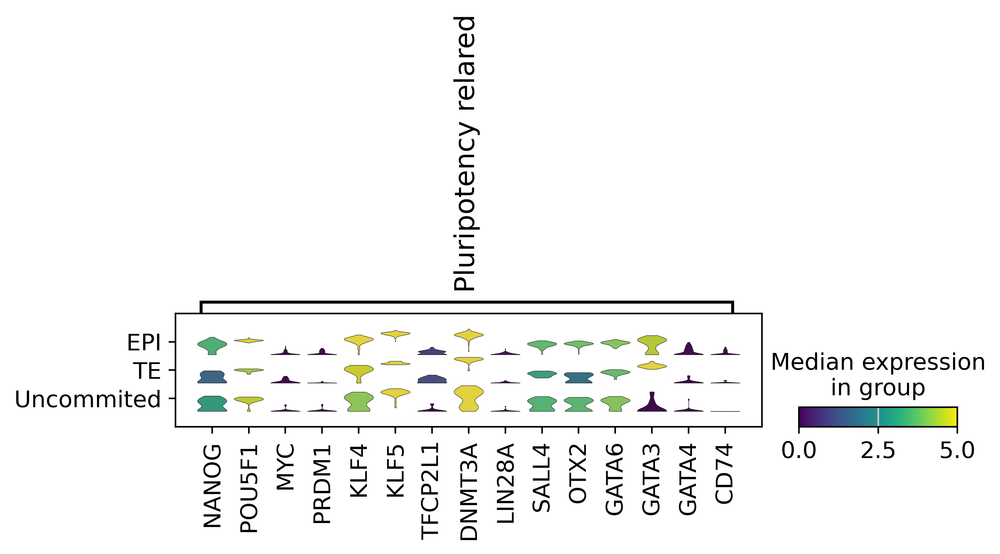

In [74]:
sc.pl.stacked_violin(adatajiang,  Pluripotency, groupby=('Lines'),  dendrogram=False, cmap='viridis', vmax=5, show=False)
plt.savefig('Figures/S2O_Jiang.pdf', bbox_inches="tight")

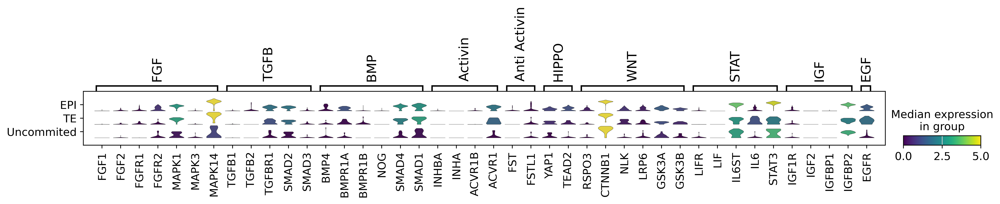

In [75]:
sc.pl.stacked_violin(adatajiang,  Signalling, groupby=('Lines'),  dendrogram=False, cmap='viridis', vmax=5, show=False)
plt.savefig('Figures/S2P_Jiang.pdf', bbox_inches="tight")

### 10x Pseudobulk Violin Plots

In [76]:
adata10x = adata[adata.obs.Study=='Blastoid - 10x Pseudo-Bulk'].copy()

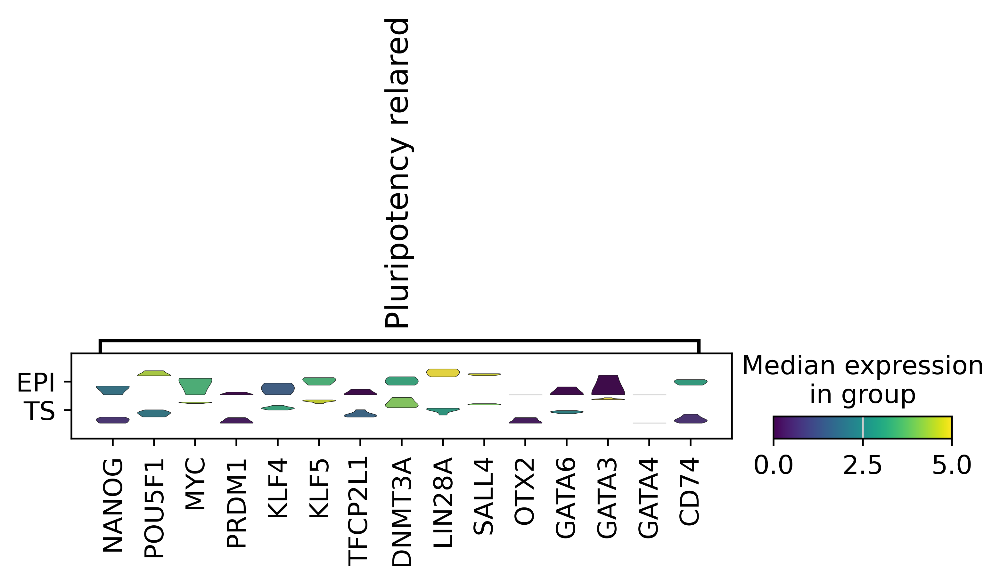

In [77]:
sc.pl.stacked_violin(adata10x[adata10x.obs.Lines.isin(["EPI", "TS"])],  Pluripotency, groupby=('Lines'),  dendrogram=False, cmap='viridis', vmax=5, show=False)
plt.savefig('Figures/S2O_10xPseudo.pdf', bbox_inches="tight")

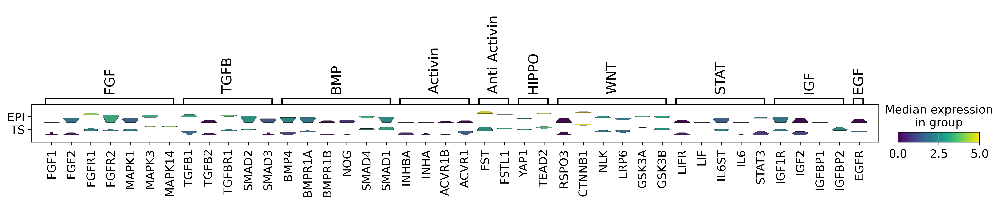

In [78]:
sc.pl.stacked_violin(adata10x[adata10x.obs.Lines.isin(["EPI", "TS"])],  Signalling, groupby=('Lines'),  dendrogram=False, cmap='viridis', vmax=5, show=False)
plt.savefig('Figures/S2P_10xPseudo.pdf', bbox_inches="tight")